In [25]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from IPython.display import display

plt.style.use('fivethirtyeight')
sns.set_style({'font.sans-serif':['simhei','Arial']})
%matplotlib inline

In [26]:
lianjia_df = pd.read_csv('lianjia.csv')
lianjia_df.head(2)

,Direction,District,Elevator,Floor,Garden,Id,Layout,Price,Region,Renovation,Size,Year
0,东西,灯市口,NaN,6,锡拉胡同21号院,101102647043,3室1厅,780.0,东城,精装,75.0,1988
1,南北,东单,无电梯,6,东华门大街,101102650978,2室1厅,705.0,东城,精装,60.0,1988


In [27]:
lianjia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23677 entries, 0 to 23676
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Direction   23677 non-null  object 
 1   District    23677 non-null  object 
 2   Elevator    15440 non-null  object 
 3   Floor       23677 non-null  int64  
 4   Garden      23677 non-null  object 
 5   Id          23677 non-null  int64  
 6   Layout      23677 non-null  object 
 7   Price       23677 non-null  float64
 8   Region      23677 non-null  object 
 9   Renovation  23677 non-null  object 
 10  Size        23677 non-null  float64
 11  Year        23677 non-null  int64  
dtypes: float64(2), int64(3), object(7)
memory usage: 2.2+ MB


In [28]:
lianjia_df.describe()

,Floor,Id,Price,Size,Year
count,23677.000000,2.367700e+04,23677.000000,23677.000000,23677.000000
mean,12.765088,1.011024e+11,610.668319,99.149301,2001.326519
std,7.643932,5.652477e+05,411.452107,50.988838,9.001996
min,1.000000,1.010886e+11,60.000000,2.000000,1950.000000
25%,6.000000,1.011022e+11,365.000000,66.000000,1997.000000
50%,11.000000,1.011025e+11,499.000000,88.000000,2003.000000
75%,18.000000,1.011027e+11,717.000000,118.000000,2007.000000
max,57.000000,1.011028e+11,6000.000000,1019.000000,2017.000000


In [29]:
# 添加新特征房屋均价
df = lianjia_df.copy()
df['PerSqPrice'] = lianjia_df['Price']/lianjia_df['Size']

In [30]:
# 重新摆放列位置 Id没用所以删除
columns = ['Region', 'District', 'Garden', 'Layout', 'Floor', 'Year', 'Size', 'Elevator', 'Direction', 'Renovation', 'PerSqPrice', 'Price']
df = pd.DataFrame(df, columns=columns)

In [31]:
# 重新审查数据集
df.head(2)

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerSqPrice,Price
0,东城,灯市口,锡拉胡同21号院,3室1厅,6,1988,75.0,NaN,东西,精装,10.40,780.0
1,东城,东单,东华门大街,2室1厅,6,1988,60.0,无电梯,南北,精装,11.75,705.0


In [32]:
# 分析Region的特征
# 对二手房区域分组对比二手房数量和每平米房价
df_house_count = df.groupby('Region')['Price'].count().sort_values(ascending=False).to_frame().reset_index()
df_house_mean = df.groupby('Region')['PerSqPrice'].mean().sort_values(ascending=False).to_frame().reset_index()

Text(0, 0.5, '房屋总价')

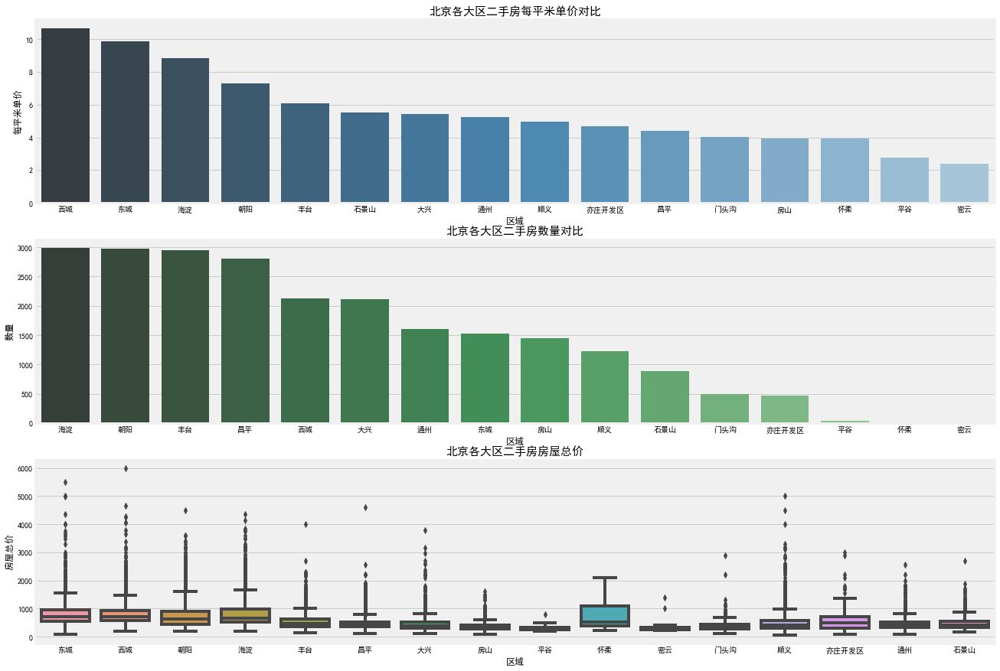

In [33]:
f, [ax1,ax2,ax3] = plt.subplots(3,1,figsize=(20,15))
sns.barplot(x='Region', y='PerSqPrice', palette='Blues_d', data=df_house_mean, ax=ax1)
ax1.set_title('北京各大区二手房每平米单价对比',fontsize=15)
ax1.set_xlabel('区域')
ax1.set_ylabel('每平米单价')

sns.barplot(x='Region', y='Price', palette="Greens_d", data=df_house_count, ax=ax2)
ax2.set_title('北京各大区二手房数量对比',fontsize=15)
ax2.set_xlabel('区域')
ax2.set_ylabel('数量')

sns.boxplot(x='Region', y='Price', data=df, ax=ax3)
ax3.set_title('北京各大区二手房房屋总价',fontsize=15)
ax3.set_xlabel('区域')
ax3.set_ylabel('房屋总价')

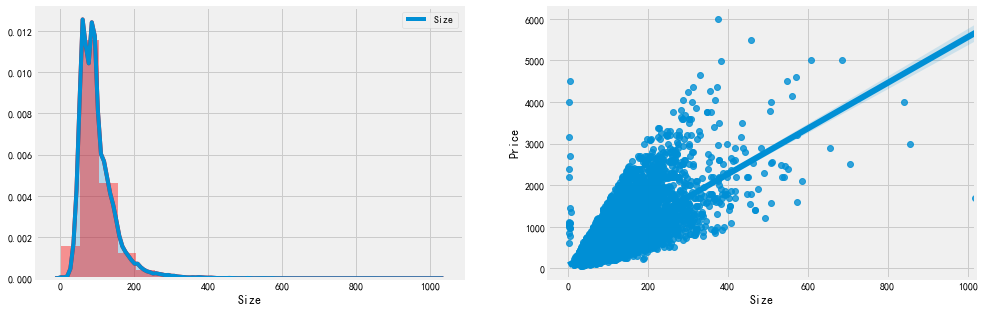

In [34]:
# Size特征分析
f, [ax1,ax2] = plt.subplots(1,2,figsize=(15,5))

# 建房时间分布
sns.distplot(df['Size'], bins=20, ax=ax1, color='r')
sns.kdeplot(df['Size'], shade=True, ax=ax1)

# 建房时间和出售价格的关系
sns.regplot(x='Size', y='Price', data=df, ax=ax2)
plt.show()

In [35]:
df.loc[df['Size']<10]

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerSqPrice,Price
1168,房山,长阳,世茂维拉,叠拼别墅,5,2015,5.0,毛坯,240.97平米,南北,216.000000,1080.0
1458,房山,长阳,世茂维拉,叠拼别墅,5,2015,5.0,毛坯,242.78平米,南北,220.000000,1100.0
1797,房山,长阳,世茂维拉,叠拼别墅,5,2015,5.0,精装,242.96平米,南北,196.000000,980.0
2268,顺义,顺义其它,龙湖好望山,叠拼别墅,4,2014,4.0,精装,295.88平米,南北,250.000000,1000.0
2274,顺义,顺义其它,鹭峯国际,叠拼别墅,4,2014,5.0,精装,295.01平米,南北,290.000000,1450.0
2276,顺义,顺义其它,龙湖好望山,叠拼别墅,3,2014,4.0,毛坯,292.31平米,南北,215.000000,860.0
2432,顺义,顺义其它,龙湖好望山,叠拼别墅,5,2013,6.0,精装,294.42平米,南北,163.333333,980.0
4078,大兴,西红门,鸿坤林语墅,叠拼别墅,3,2015,4.0,精装,427.5平米,南北,787.500000,3150.0
4079,大兴,西红门,鸿坤林语墅,叠拼别墅,4,2015,4.0,精装,361.8平米,南北,595.000000,2380.0
4761,大兴,西红门,鸿坤林语墅,叠拼别墅,3,2015,5.0,精装,386.83平米,南北,540.000000,2700.0


In [36]:
df.loc[df['Size']>1000]

,Region,District,Garden,Layout,Floor,Year,Size,Elevator,Direction,Renovation,PerSqPrice,Price
8754,通州,通州其它,新华联科技大厦,1房间0卫,8,2009,1019.0,有电梯,南,简装,1.668302,1700.0


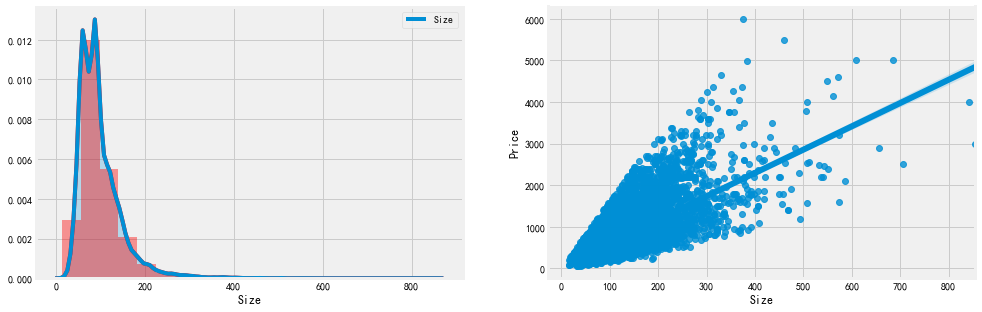

In [37]:
df = df[(df['Layout']!='叠拼别墅')&(df['Size']<1000)]
# Size特征分析
f, [ax1,ax2] = plt.subplots(1,2,figsize=(15,5))

# 建房时间分布
sns.distplot(df['Size'], bins=20, ax=ax1, color='r')
sns.kdeplot(df['Size'], shade=True, ax=ax1)

# 建房时间和出售价格的关系
sns.regplot(x='Size', y='Price', data=df, ax=ax2)
plt.show()

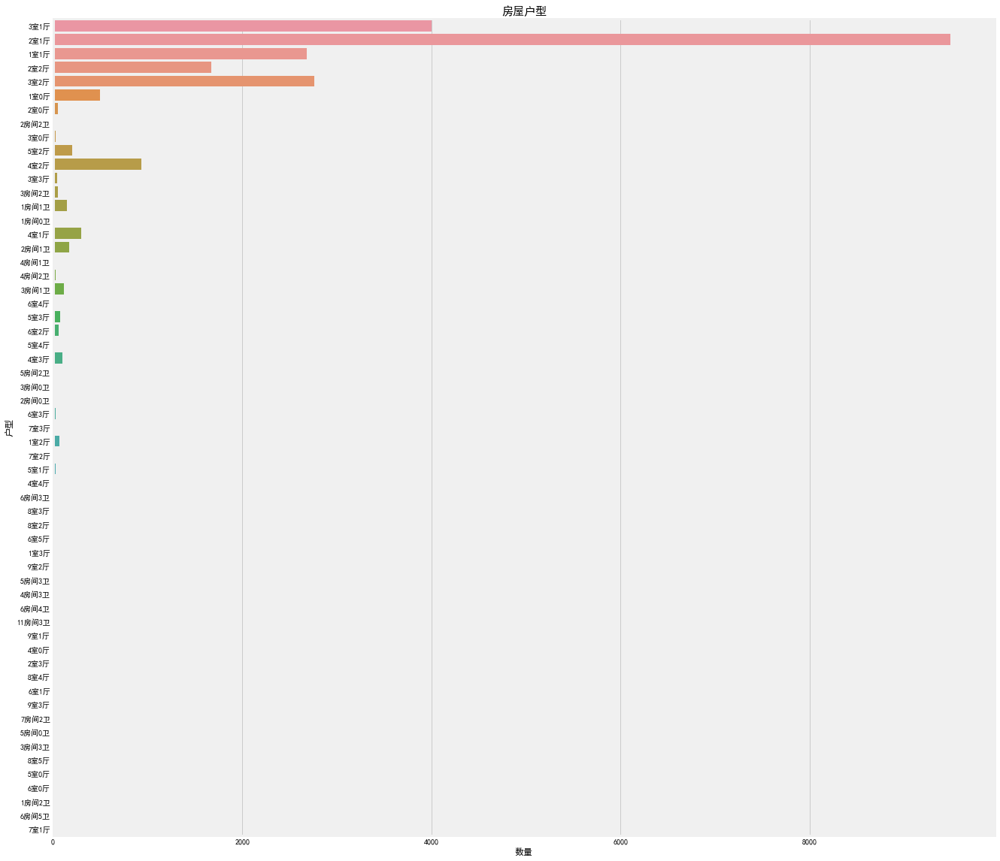

In [38]:
# Layout特征分析
f, ax1 = plt.subplots(figsize=(20,20))
sns.countplot(y='Layout',data=df,ax=ax1)
ax1.set_title('房屋户型',fontsize=15)
ax1.set_xlabel('数量')
ax1.set_ylabel('户型')
plt.show()

In [39]:
# 特征分析
df['Renovation'].value_counts()

精装    11345
简装     8496
其他     3239
毛坯      576
Name: Renovation, dtype: int64

In [40]:
# 如果里面有不想要的，需要清除或者替换掉  比如有错误数据'南北'
df['Renovation'] = df.loc[(df['Renovation']!='南北'),'Renovation']

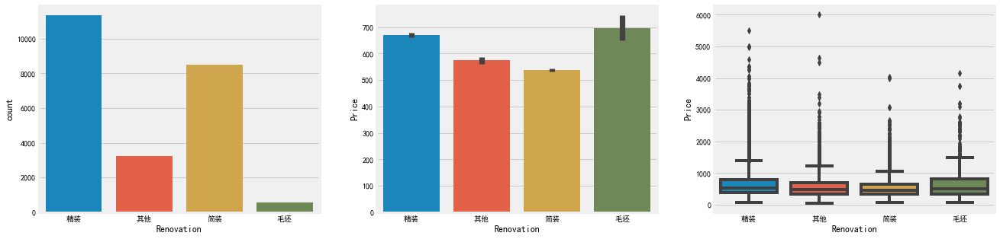

In [41]:
# 画图
f, [ax1,ax2,ax3] = plt.subplots(1,3,figsize=(20,5))
sns.countplot(df['Renovation'],ax=ax1)
sns.barplot(x='Renovation',y='Price',data=df,ax=ax2)
sns.boxplot(x='Renovation',y='Price',data=df,ax=ax3)
plt.show()

In [42]:
# Elevator特征分析
# Elevator有大量缺失值，首先查看有多少缺失值            ************
misn = len(df.loc[(df['Elevator'].isnull()),'Elevator'])
print('Elevator缺失值数量为：' + str(misn))

Elevator缺失值数量为：8237


In [43]:
# 这个地方判断的是有没有电梯，考虑使用填补法来做，一般低于6层没有电梯，高于6层有电梯
# 由于存在个别类型错误，如简装和精装，特征值错位，所以需要移除     *************
df['Elevator'] = df.loc[(df['Elevator'] == '有电梯')|(df['Elevator'] == '有电梯'), 'Elevator']

In [44]:
# 填补Elevator缺失值
df.loc[(df['Floor']>6)&(df['Elevator'].isnull()),'Elevator'] = '有电梯'
df.loc[(df['Floor']<=6)&(df['Elevator'].isnull()),'Elevator'] = '无电梯'

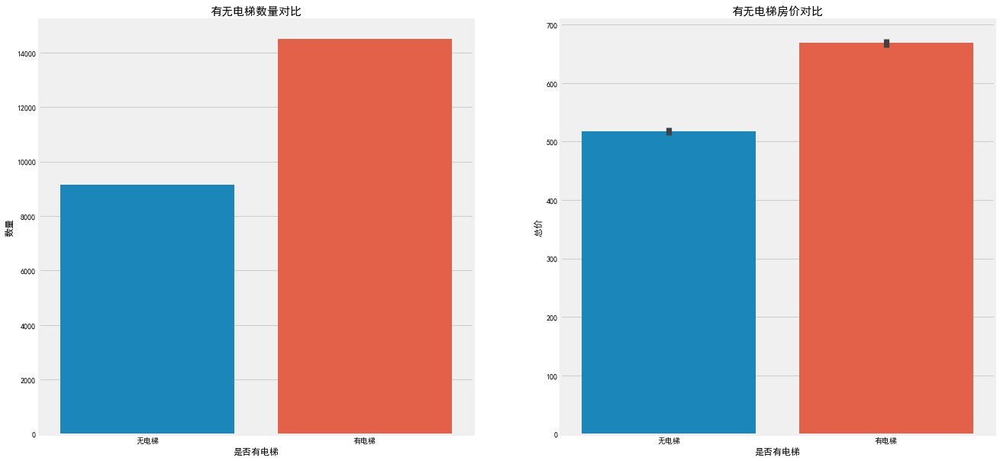

In [45]:
f, [ax1,ax2] = plt.subplots(1,2,figsize=(20,10))
sns.countplot(df['Elevator'], ax=ax1)
ax1.set_title('有无电梯数量对比',fontsize=15)
ax1.set_xlabel('是否有电梯')
ax1.set_ylabel('数量')

sns.barplot(x='Elevator',y='Price',data=df,ax=ax2)
ax2.set_title('有无电梯房价对比', fontsize=15)
ax2.set_xlabel('是否有电梯')
ax2.set_ylabel('总价')
plt.show()

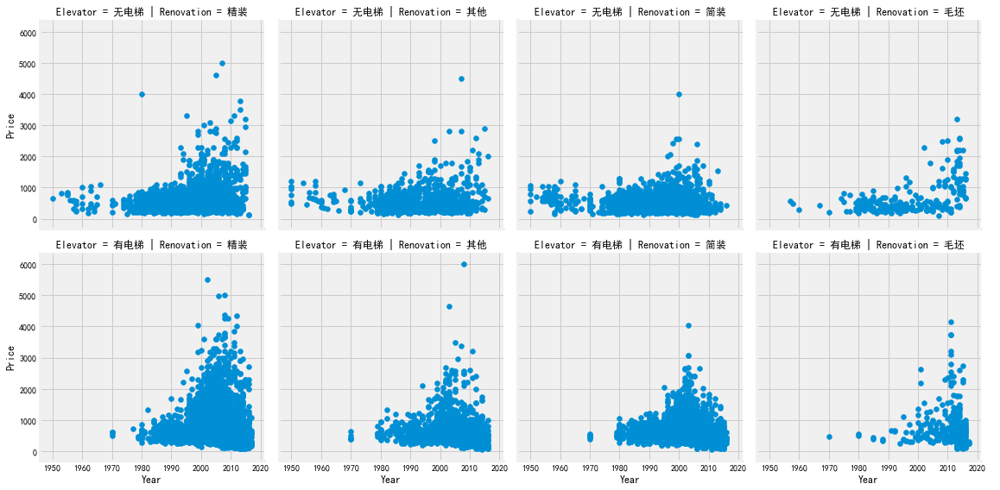

In [46]:
# Year特征分析 **************
grid = sns.FacetGrid(df, row='Elevator', col='Renovation', palette='seismic', size=4)
grid.map(plt.scatter, 'Year', 'Price')
grid.add_legend()

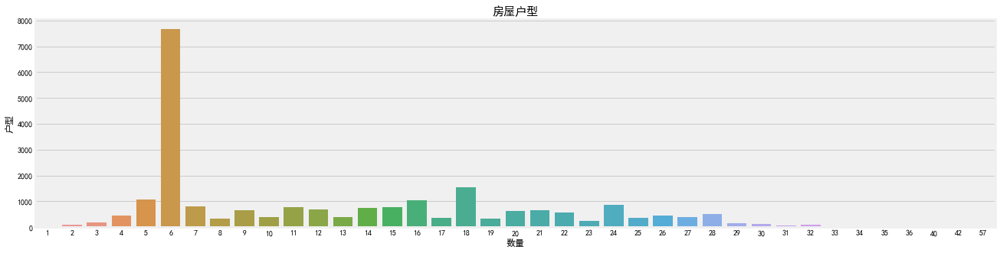

In [47]:
# Floor特征总结
f, ax1 = plt.subplots(figsize=(20,5))
sns.countplot(x='Floor', data=df, ax=ax1)
ax1.set_title('房屋户型', fontsize=15)
ax1.set_xlabel('数量')
ax1.set_ylabel('户型')
plt.show()

In [50]:
# 查看特征值
df['Layout'].value_counts()

2室1厅      9485
3室1厅      3999
3室2厅      2765
1室1厅      2681
2室2厅      1671
4室2厅       930
1室0厅       499
4室1厅       295
5室2厅       200
2房间1卫      170
1房间1卫      146
3房间1卫      116
4室3厅        96
5室3厅        75
1室2厅        67
6室2厅        59
3房间2卫       53
2室0厅        50
3室3厅        43
4房间2卫       31
3室0厅        29
6室3厅        29
5室1厅        27
2房间2卫       18
4房间1卫       15
1房间0卫       14
5房间2卫       10
7室3厅         7
4房间3卫        7
5房间3卫        6
7室2厅         6
2室3厅         5
5室4厅         4
6室4厅         4
4室4厅         4
8室3厅         4
3房间0卫        3
8室2厅         3
4室0厅         3
6房间4卫        3
6室0厅         2
3房间3卫        2
1房间2卫        2
6房间3卫        2
2房间0卫        2
7室1厅         1
8室5厅         1
5室0厅         1
8室4厅         1
9室2厅         1
9室3厅         1
6室1厅         1
6室5厅         1
5房间0卫        1
1室3厅         1
7房间2卫        1
9室1厅         1
11房间3卫       1
6房间5卫        1
Name: Layout, dtype: int64

In [54]:
# # 只考虑‘室’和‘厅’，将其他少数‘房间’和‘卫’移除
# df = df.loc[df['Layout'].str.extract('^\d(.*?)\d.*?') == '室']

# # 提取‘室’和‘厅’创建新特征
# df['Layout_room_num'] = df['Layout'].str.extract('(^\d).*', expand=False).astype('int64')
# df['Layout_hall_num'] = df['Layout'].str.extract('^\d.*?(\d).*', expand=False).astype('int64')